In [ ]:
!nvidia-smi

In [ ]:
!pwd

/content


In [ ]:
!ls

Archive.zip  detectron2_repo  __MACOSX	output	sample_data  trainval.json


In [ ]:
cd drive/

[Errno 2] No such file or directory: 'drive/'
/content


In [ ]:
#Install detectron2

!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

Requirement already up-to-date: torch in /usr/local/lib/python3.6/dist-packages (1.6.0+cu101)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.6/dist-packages (0.7.0+cu101)
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-y6bjhghs
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-y6bjhghs
     |████████████████████████████████| 276kB 6.4MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2-cp36-none-any.whl size=47852 sha256=3a24f0411944613fd7f24f787968ee86b515bbfab7d693509aab92de1683e259
  Stored in directory: /tmp/pip-ephem-wheel-cache-wf6fftet/wheels/48/53/79/3c6485543a4455a0006f5db590ab9957622b6227011941de06
  Created wheel for pyyaml: filename=PyYAML-5.3.1-cp36-cp36m-linux_x86_64.whl size=44619 sha256=6e5245cd1cf68930d0d3ff5441a88d27559f366a5b4f99bc4557d5cae245b318
  Stored in directory: /root/.cache/pip/wheels/a7/c1/ea/cf5bd31012e735dc1dfea3131a2d5eae7978b251083d6247bd
Successfully

'1.6.0+cu101'

In [ ]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 24, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 7217 (delta 3), reused 9 (delta 3), pack-reused 7193
Receiving objects: 100% (7217/7217), 3.33 MiB | 25.29 MiB/s, done.
Resolving deltas: 100% (5106/5106), done.
Obtaining file:///content/detectron2_repo
     |████████████████████████████████| 2.2MB 5.5MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0
  Running setup.py develop for detectron2


In [ ]:
# install detectron2: Dont Run
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html


In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
!unzip /content/Archive.zip

Archive:  /content/Archive.zip
warning [/content/Archive.zip]:  15082753 extra bytes at beginning or within zipfile
  (attempting to process anyway)
file #1:  bad zipfile offset (local header sig):  15082753
  (attempting to re-compensate)
   creating: trainimages/
  inflating: __MACOSX/._trainimages  
  inflating: trainimages/63.jpg      
  inflating: __MACOSX/trainimages/._63.jpg  
  inflating: trainimages/189.jpg     
  inflating: __MACOSX/trainimages/._189.jpg  
  inflating: trainimages/77.jpg      
  inflating: __MACOSX/trainimages/._77.jpg  
  inflating: trainimages/162.jpg     
  inflating: __MACOSX/trainimages/._162.jpg  
  inflating: trainimages/176.jpg     
  error:  invalid compressed data to inflate
file #12:  bad zipfile offset (local header sig):  1328922
  (attempting to re-compensate)
file #12:  bad zipfile offset (local header sig):  1328922
file #13:  bad zipfile offset (local header sig):  16411915
file #14:  bad zipfile offset (local header sig):  16512947
file #15:

In [ ]:
!pwd

/content


In [ ]:
!ls

data.zip  detectron2_repo  sample_data


In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("sample", {}, "./trainval.json", "./trainimages")

In [ ]:
sample_metadata = MetadataCatalog.get("sample")
dataset_dicts = DatasetCatalog.get("sample")

WARNING [10/01 08:07:42 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/01 08:07:42 d2.data.datasets.coco]: Loaded 402 images in COCO format from ./trainval.json


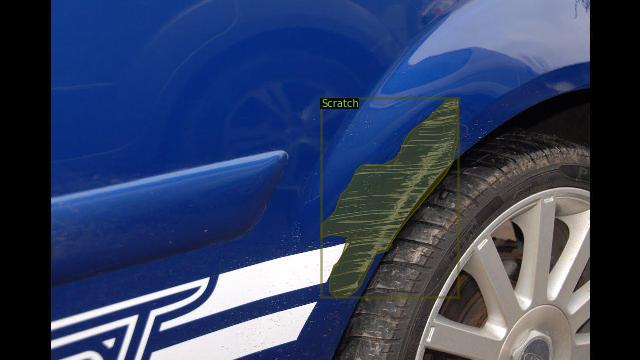

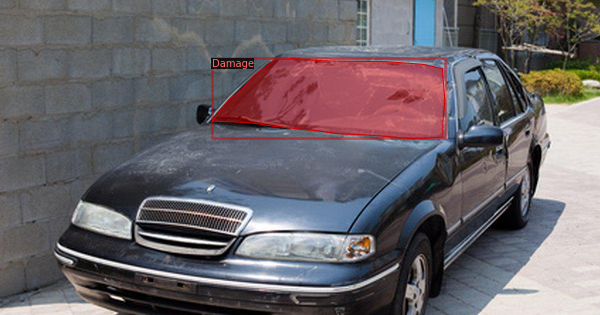

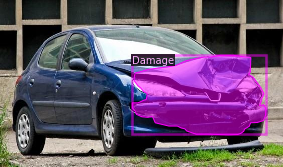

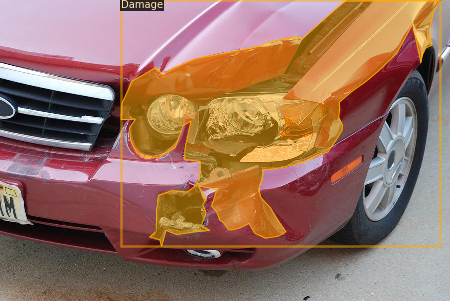

In [ ]:
import random

for d in random.sample(dataset_dicts, 4):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=sample_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo

fatal: destination path 'detectron2_repo' already exists and is not an empty directory.


In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("sample",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.02
cfg.SOLVER.MAX_ITER = 80000   # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  # 3 classes (Person, Helmet, Car)
# cfg.MODEL.DEVICE = 'cpu'
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/01 08:47:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (3, 256, 1, 1) 

[10/01 08:47:11 d2.engine.train_loop]: Starting training from iteration 0
[10/01 08:47:18 d2.utils.events]:  eta: 6:50:48  iter: 19  total_loss: 2.287  loss_cls: 0.9168  loss_box_reg: 0.3615  loss_mask: 0.6909  loss_rpn_cls: 0.06831  loss_rpn_loc: 0.01507  time: 0.3521  data_time: 0.0780  lr: 0.00039962  max_mem: 2763M
[10/01 08:47:24 d2.utils.events]:  eta: 6:44:58  iter: 39  total_loss: 1.405  loss_cls: 0.3636  loss_box_reg: 0.3794  loss_mask: 0.622  loss_rpn_cls: 0.04517  loss_rpn_loc: 0.01121  time: 0.3241  data_time: 0.0193  lr: 0.00079922  max_mem: 2763M
[10/01 08:47:30 d2.utils.events]:  eta: 6:38:56  iter: 59  total_loss: 1.334  loss_cls: 0.337  loss_box_reg: 0.3811  loss_mask: 0.5889  loss_rpn_cls: 0.03059  loss_rpn_loc: 0.009501  time: 0.3116  data_time: 0.0056  lr: 0.0011988  max_mem: 2763M
[10/01 08:47:36 d2.utils.events]:  eta: 6:38:39  iter: 79  total_loss: 1.252  loss_cls: 0.3347  loss_box_reg: 0.4223  loss_mask: 0.478  loss_rpn_cls: 0.01729  loss_rpn_loc: 0.008967  time

FloatingPointError: ignored

In [ ]:
cfg.OUTPUT_DIR

'./output'

In [ ]:
import pickle


In [ ]:
filename = '/content/config.pkl'
with open(filename, 'wb') as f:
     pickle.dump(cfg, f)

In [ ]:
cfg = None
filename = '/content/config.pkl'
with open(filename, 'rb') as f:
     cfg = pickle.load(f)

In [ ]:
cfg.MODEL.DEVICE = 'gpu'

In [ ]:
!rm -rf trainimages

In [ ]:
!rm -rf __MACOSX

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set the testing threshold for this model
cfg.DATASETS.TEST = ("sample", )
predictor = DefaultPredictor(cfg)

In [ ]:
from detectron2.utils.visualizer import ColorMode

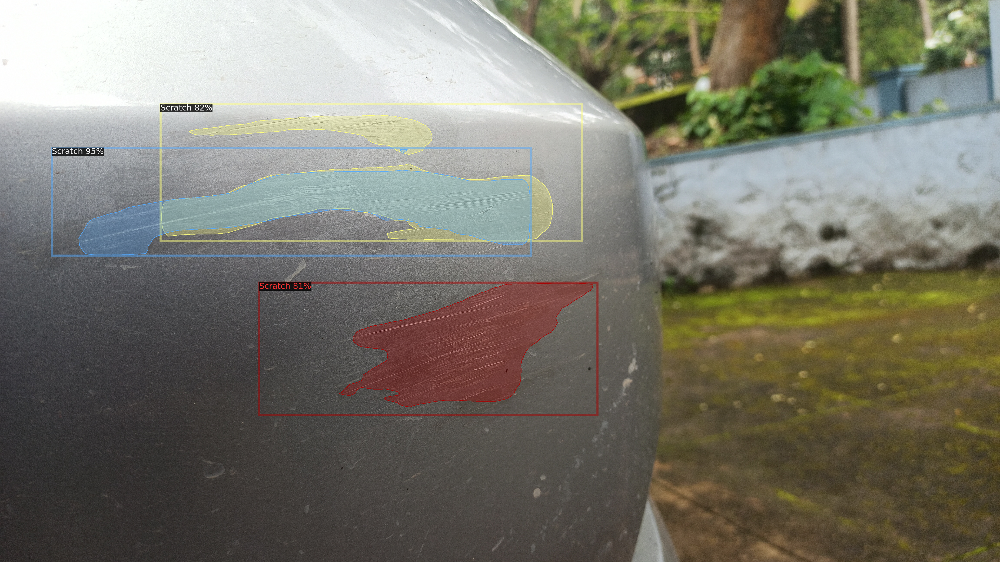

In [ ]:
im = cv2.imread('image10.jpg')
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
                metadata=sample_metadata, 
                scale=0.8, 
                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

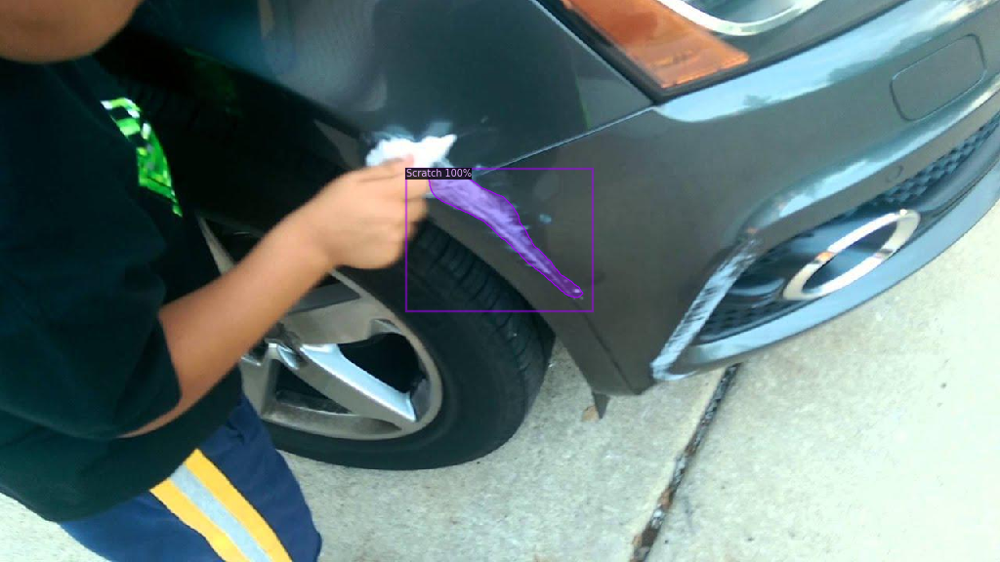

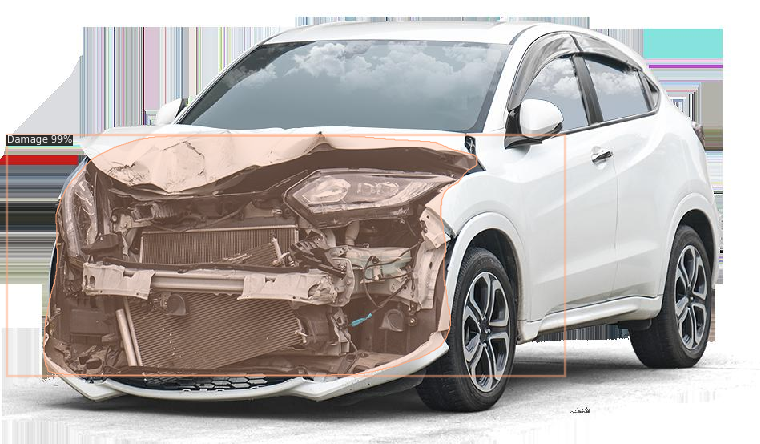

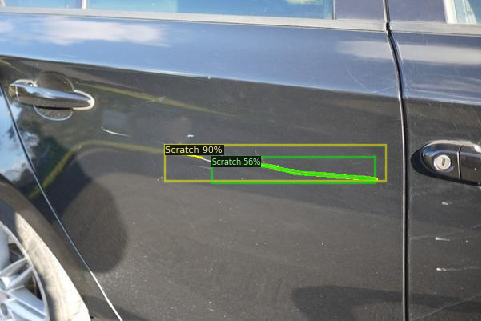

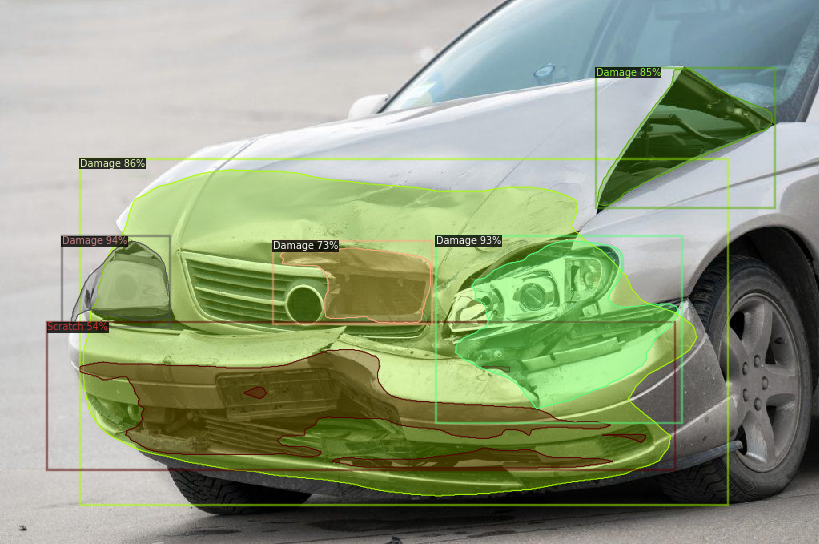

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts, 4):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=sample_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])